In [1]:
!nvidia-smi

Mon Apr 29 23:12:21 2024       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.76                 Driver Version: 550.76         CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce RTX 2070 ...    Off |   00000000:0A:00.0  On |                  N/A |
|  0%   48C    P5             24W /  215W |     503MiB /   8192MiB |     14%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [2]:
import opendatasets as od
import unicodedata
import re
from io import open
import matplotlib.pyplot as plt
from torchvision.transforms import Compose,Normalize,ToTensor,Resize

from torchvision.models import resnet50,ResNet50_Weights

import torch
import torch.nn as nn
from torch import optim
from torch.utils.data import Dataset,DataLoader,random_split
from torchvision import datasets
import numpy as np
from PIL import Image

In [3]:
if torch.cuda.is_available:
  device=torch.device(type="cuda",index=0)
else:
  device=torch.device(type="cpu",index=0)
  
print(device)

cuda:0


In [4]:
od.download("https://www.kaggle.com/datasets/adityajn105/flickr8k?select=Images")

Skipping, found downloaded files in "./flickr8k" (use force=True to force download)


In [5]:
def normalize_string(s):
  sres=""
  for ch in unicodedata.normalize('NFD',s):
    if unicodedata.category(ch)!='Mn':
      sres+=ch
  sres=re.sub(r'[^A-Za-z?!,]+',r" ",sres)
  return sres.strip()

In [6]:
str="Hel~o"
print(normalize_string(str))

Hel o


(375, 500)


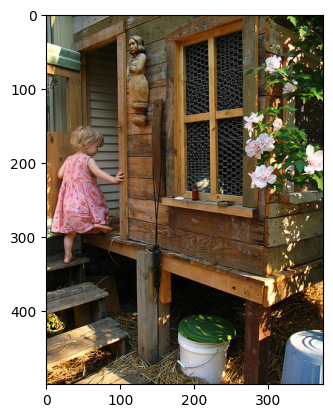

In [7]:
image1=Image.open("./flickr8k/Images/1000268201_693b08cb0e.jpg")
image1_array=np.array(image1)
plt.imshow(image1_array)
print(image1.size)

In [8]:
caption_path="./flickr8k/captions.txt"
data=open(caption_path).read().strip()
print(type(data))
data=open(caption_path).read().strip().split('\n')
print(type(data))
print(data[0])
print(data[1])

<class 'str'>
<class 'list'>
image,caption
1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set of stairs in an entry way .


In [9]:
image_filename_list=[]
image_caption_list=[]
for element in data[1:]:
  temp=element.lower().split(',')
  print(temp)
  break

['1000268201_693b08cb0e.jpg', 'a child in a pink dress is climbing up a set of stairs in an entry way .']


In [10]:
data=data[1:]

In [11]:
for element in data:
  temp=element.lower().split(',')
  image_path=temp[0]
  caption=','.join(s for s in temp[1:])
  image_filename_list.append(image_path)
  image_caption_list.append(caption)

In [12]:
print(len(image_filename_list))
print(len(image_caption_list))

40455
40455


In [13]:
max_caption_length=73

In [14]:
class Vocab:
  def __init__(self):
    self.word_to_index={'SOS':0,'EOS':1}
    self.index_to_word={0:'SOS',1:'EOS'}
    self.word_to_count={}
    self.n_count=2

  def build_vocab(self,s):
    for word in s.split(" "):
      if word not in self.word_to_index:
        self.word_to_index[word]=self.n_count
        self.index_to_word[self.n_count]=word
        self.word_to_count[word]=1
        self.n_count+=1
      else:
        self.word_to_count[word]+=1;


In [15]:
vocab=Vocab()
for caption in image_caption_list:
  vocab.build_vocab(caption)
print(vocab.n_count)

9182


In [16]:
class CustomDataset(Dataset):
  def __init__(self,image_path,image_filename_list,caption_list,max_vocab,vocab):
    super().__init__()
    self.image_path=image_path
    self.image_filename_list=image_filename_list
    self.caption_list=caption_list
    self.max_vocab=max_vocab
    self.vocab=vocab
    self.length=len(self.caption_list)
    self.transform=Compose([Resize((224,224),antialias=True),ToTensor(),Normalize(mean=[0.485, 0.456, 0.406],std=[0.229, 0.224, 0.225])])

  def __len__(self):
    return self.length

  def get_input_ids(self,sentence,vocab):
    input_ids=[0]*(self.max_vocab+1)
    i=0
    for word in sentence.split(" "):
      input_ids[i]=vocab.word_to_index[word]
      i=i+1
    input_ids.insert(0,vocab.word_to_index['SOS'])
    i=i+1
    input_ids[i]=vocab.word_to_index['EOS']
    return torch.tensor(input_ids)

  def __getitem__(self,idx):
    image_name=self.image_filename_list[idx]
    caption=self.caption_list[idx]
    image_path=self.image_path+image_name
    image=Image.open(image_path)
    image=self.transform(image)
    caption=self.get_input_ids(caption,self.vocab)
    return image,caption


In [17]:
dataset=CustomDataset("./flickr8k/Images/",image_filename_list,image_caption_list,max_caption_length,vocab)
train_dataset,test_dataset=random_split(dataset,[0.999,0.001])
batch_size=64
train_dataloader=DataLoader(train_dataset,batch_size=batch_size,shuffle=True)
test_dataloader=DataLoader(test_dataset,batch_size=1)

In [18]:
class Encoder(nn.Module):
  def __init__(self,pretrained_feature_extractor):
    super().__init__()
    self.pretrained_feature_extractor=pretrained_feature_extractor
  def forward(self,x):
    features=self.pretrained_feature_extractor(x)
    return features

In [19]:
pretrained_feature_extractor=resnet50(weights=ResNet50_Weights.DEFAULT)

In [20]:
pretrained_feature_extractor.fc=nn.Linear(2048,1024)
encoder=Encoder(pretrained_feature_extractor)
encoder = encoder.to(device)

In [21]:
class Decoder(nn.Module):
  def __init__(self,output_size,embedding_size,hidden_size):
    super().__init__()
    self.e=nn.Embedding(output_size,embedding_size)
    self.relu=nn.ReLU()
    self.gru=nn.GRU(embedding_size,hidden_size,batch_first=True)
    self.lin=nn.Linear(hidden_size,output_size)
    self.softmax=nn.LogSoftmax(dim=-1)
  def forward(self,x,prev_hidden):
    x=self.e(x)
    x=self.relu(x)
    output,hidden=self.gru(x,prev_hidden)
    y=self.lin(output)
    y=self.softmax(y)
    return y,hidden

In [22]:
embed_size=300
hidden_size=1024

In [23]:
decoder=Decoder(vocab.n_count,embed_size,hidden_size)
decoder=decoder.to(device)

In [24]:
def train_one_epoch():
    encoder.train()
    decoder.train()
    track_loss=0
    
    for i, (imgs,t_ids) in enumerate(train_dataloader):
        imgs=imgs.to(device)
        t_ids=t_ids.to(device)
        extracted_features=encoder(imgs)
        #extracted_features=extracted_features.detach()
        decoder_hidden=torch.reshape(extracted_features,(1,extracted_features.shape[0],-1))
        yhats, decoder_hidden = decoder(t_ids[:,0:-1],decoder_hidden)
                    
        gt=t_ids[:,1:]
        
        yhats_reshaped=yhats.view(-1,yhats.shape[-1])
        
        gt=gt.reshape(-1)
        
        
        loss=loss_fn(yhats_reshaped,gt)
        track_loss+=loss.item()
        
        opte.zero_grad()
        optd.zero_grad()
        
        loss.backward()
        
        opte.step()
        optd.step()
        
        if i%50==0:
            print("Mini Batch=", i+1," Running Loss=",track_loss/(i+1), sep="")
        
    return track_loss/len(train_dataloader)

In [31]:
def ids2Sentence(ids,vocab):
    sentence=""
    for id in ids.squeeze():
        if id==0:
            continue
        word=vocab.index_to_word[id.item()]
        sentence+=word + " "
        if id==1:
            break
    return sentence

In [32]:
#eval loop (written assuming batch_size=1)
max_cap_length=73
def eval_one_epoch():
    encoder.eval()
    decoder.eval()
    track_loss=0
    
    with torch.no_grad():
        
        for i, (imgs,t_ids) in enumerate(test_dataloader):
            
            imgs=imgs.to(device)
            t_ids=t_ids.to(device)
            
            extracted_features=encoder(imgs)
            
            decoder_hidden=torch.reshape(extracted_features,(1,extracted_features.shape[0],-1)) #n_dim=3
            
            input_ids=t_ids[:,0]
            yhats=[]
            pred_sentence=""
            
            for j in range(1,max_cap_length+2): #j starts from 1
                probs, decoder_hidden = decoder(input_ids.unsqueeze(1),decoder_hidden)
                yhats.append(probs)
                _,input_ids=torch.topk(probs,1,dim=-1)
                input_ids=input_ids.squeeze(1,2) #still a tensor
                word=vocab.index_to_word[input_ids.item()] #batch_size=1
                pred_sentence+=word + " "
                if input_ids.item() == 1: #batch_size=1
                    break
                                
            
            gt_sentence=ids2Sentence(t_ids,vocab)
            
            print("Input Image:")
            img=imgs[0]
            img[0]=(img[0]*0.229)+0.485
            img[1]=(img[1]*0.224)+0.456
            img[2]=(img[2]*0.225)+0.406
            plt.imshow(torch.permute(imgs[0],(1,2,0)).detach().cpu())
            plt.show()
            
            print("GT Sentence:",gt_sentence)
            
            print("Predicted Sentence:",pred_sentence)
            
            yhats_cat=torch.cat(yhats,dim=1)
            yhats_reshaped=yhats_cat.view(-1,yhats_cat.shape[-1])
            gt=t_ids[:,1:j+1]
            gt=gt.view(-1)
            

            loss=loss_fn(yhats_reshaped,gt)
            track_loss+=loss.item()
            
            
        print("-----------------------------------")
        return track_loss/len(test_dataloader)

In [27]:
loss_fn=nn.NLLLoss(ignore_index=0).to(device)
lr=0.001

optd=optim.Adam(params=decoder.parameters(), lr=lr)
opte=optim.Adam(params=encoder.parameters(), lr=lr)

n_epochs=5

for e in range(n_epochs):
    print("Epoch=",e+1, " Loss=", round(train_one_epoch(),4), sep="")

Mini Batch=1 Running Loss=9.146258354187012
Mini Batch=51 Running Loss=5.052840560090308
Mini Batch=101 Running Loss=4.532124299814205
Mini Batch=151 Running Loss=4.233455065859864
Mini Batch=201 Running Loss=4.036988246500195
Mini Batch=251 Running Loss=3.886842882490728
Mini Batch=301 Running Loss=3.7718591769272307
Mini Batch=351 Running Loss=3.6770820148989687
Mini Batch=401 Running Loss=3.5963858476006183
Mini Batch=451 Running Loss=3.5286167238874078
Mini Batch=501 Running Loss=3.469331484354899
Mini Batch=551 Running Loss=3.4176740823769958
Mini Batch=601 Running Loss=3.3696506828714328


/home/joy/mainenv/lib/python3.12/site-packages/torch/autograd/graph.py:744: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


Epoch=1 Loss=3.3433
Mini Batch=1 Running Loss=2.7007241249084473
Mini Batch=51 Running Loss=2.5315427125668992
Mini Batch=101 Running Loss=2.523946462291302
Mini Batch=151 Running Loss=2.5129426425655947
Mini Batch=201 Running Loss=2.5144194595849334
Mini Batch=251 Running Loss=2.509961625019393
Mini Batch=301 Running Loss=2.5100128072440824
Mini Batch=351 Running Loss=2.5086730273700506
Mini Batch=401 Running Loss=2.5035773619749304
Mini Batch=451 Running Loss=2.498702698430571
Mini Batch=501 Running Loss=2.4944039932981936
Mini Batch=551 Running Loss=2.49229373732842
Mini Batch=601 Running Loss=2.4885104638764544
Epoch=2 Loss=2.4846
Mini Batch=1 Running Loss=1.914401650428772
Mini Batch=51 Running Loss=1.994992265514299
Mini Batch=101 Running Loss=2.0204281547282004
Mini Batch=151 Running Loss=2.0377960812966553
Mini Batch=201 Running Loss=2.047553775915459
Mini Batch=251 Running Loss=2.0532848777998964
Mini Batch=301 Running Loss=2.063611922073998
Mini Batch=351 Running Loss=2.06537

NameError: name 'max_cap_length' is not defined

Input Image:


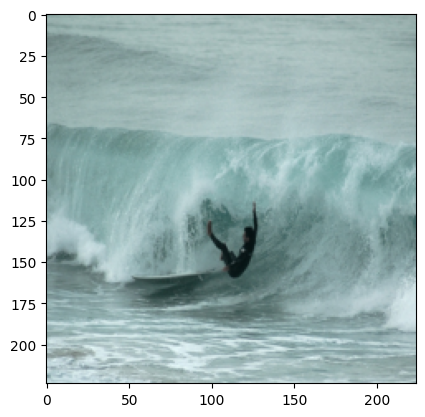

GT Sentence: a man falling off of a surfboard in the ocean EOS 
Predicted Sentence: a surfer rides a wave . EOS 
Input Image:


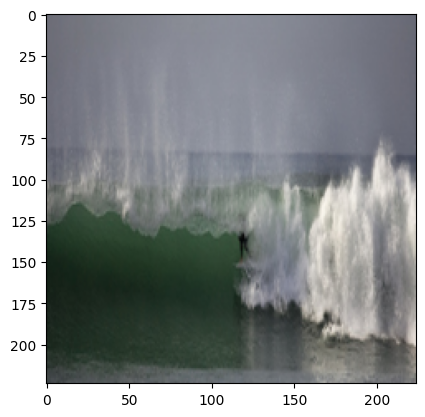

GT Sentence: water splashing up against something . EOS 
Predicted Sentence: a surfer rides a wave . EOS 
Input Image:


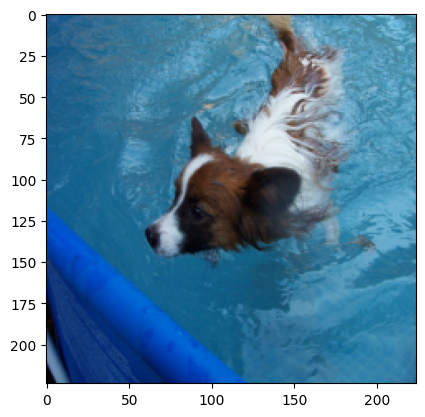

GT Sentence: the brown and white dog swims in a swimming pool . EOS 
Predicted Sentence: a brown and white dog is swimming in a pool . EOS 
Input Image:


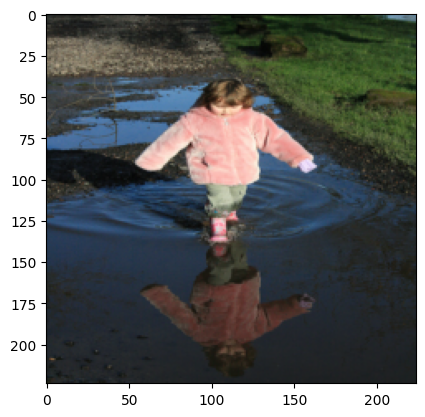

GT Sentence: a girl playing in a puddle while wearing a pink coat EOS 
Predicted Sentence: a girl in a pink coat stands in a puddle . EOS 
Input Image:


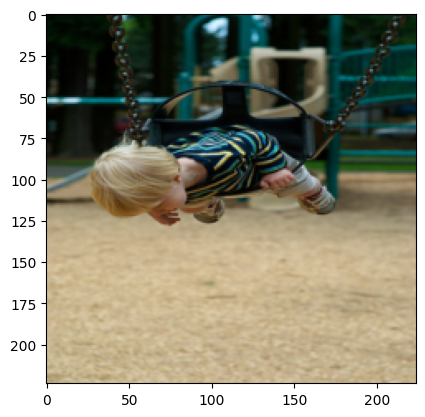

GT Sentence: blond boy in striped shirt on the swing set . EOS 
Predicted Sentence: a boy swings on a swing . EOS 
Input Image:


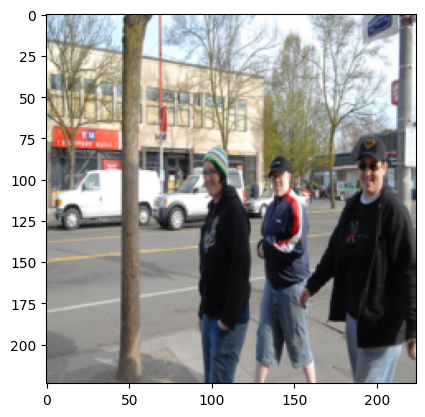

GT Sentence: three people wearing winter clothes standing on the sidewalk near a street EOS 
Predicted Sentence: three men walking on a sidewalk in a city . EOS 
Input Image:


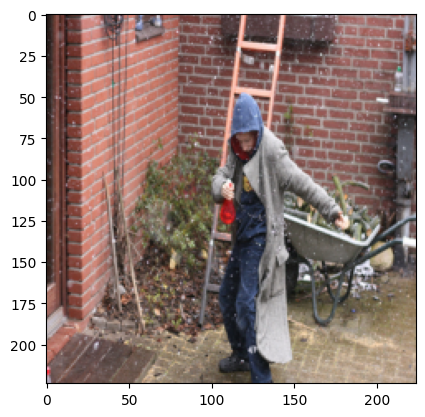

GT Sentence: woman in coat outside a house while snowing EOS 
Predicted Sentence: a man spraying a squirt bottle of water . EOS 
Input Image:


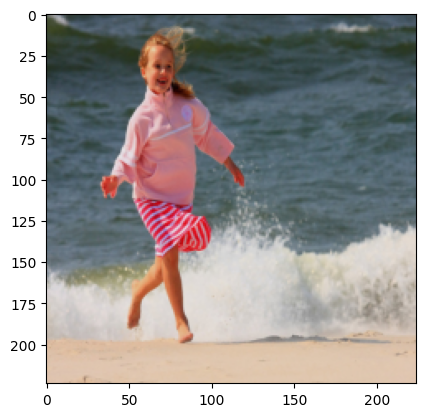

GT Sentence: a girl is walking next to the small waves that crash in the ocean . EOS 
Predicted Sentence: a girl in a red striped shirt and white skirt walks along the beach . EOS 
Input Image:


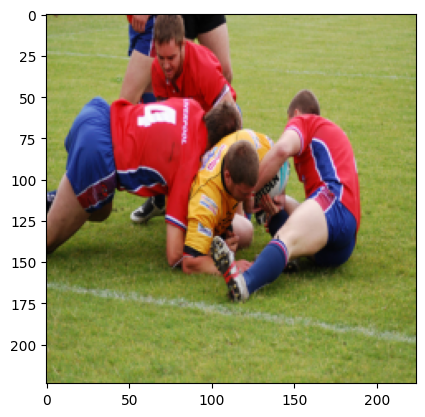

GT Sentence: the rugby players in red are wrestling the player in yellow to the ground . EOS 
Predicted Sentence: three men are playing soccer on a field . EOS 
Input Image:


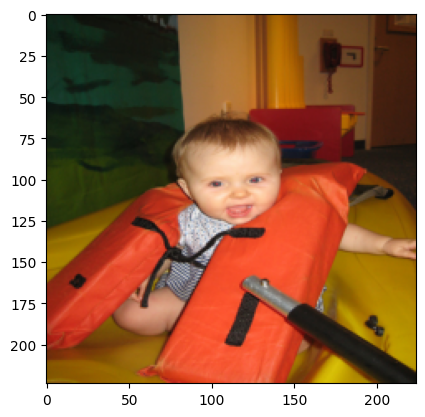

GT Sentence: a baby is wearing an adult life jacket whilst sitting in a dinghy inside the house . EOS 
Predicted Sentence: a young boy wearing a red life jacket sitting in a red plastic boat . EOS 
Input Image:


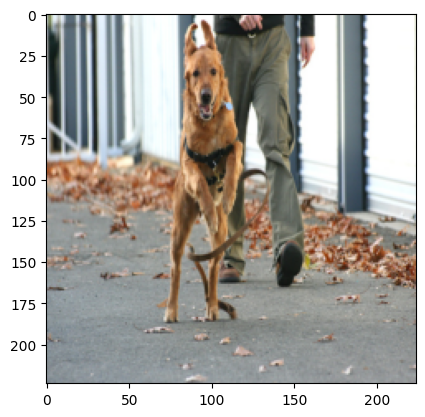

GT Sentence: dog on leash running from man EOS 
Predicted Sentence: a brown dog is running on a sidewalk with his mouth open wide . EOS 
Input Image:


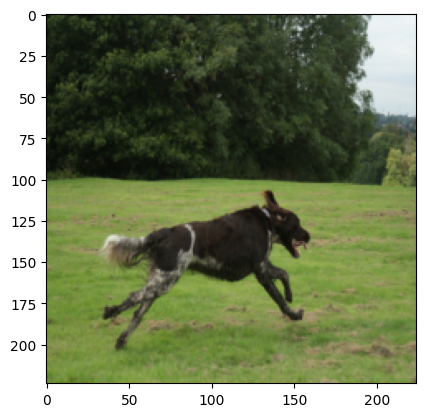

GT Sentence: a large black and white dog is running through a grassy field . EOS 
Predicted Sentence: a black dog runs across a lush green grass . EOS 
Input Image:


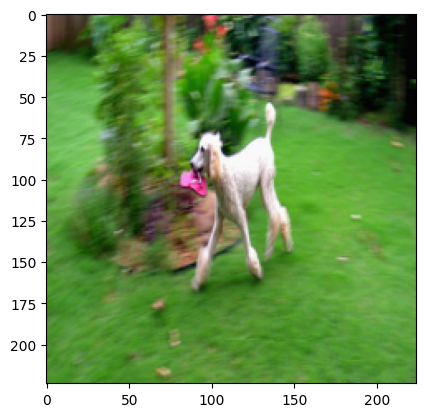

GT Sentence: large white poodle carrying a pink flip flop outside . EOS 
Predicted Sentence: a white dog carries a large stick in its mouth . EOS 
Input Image:


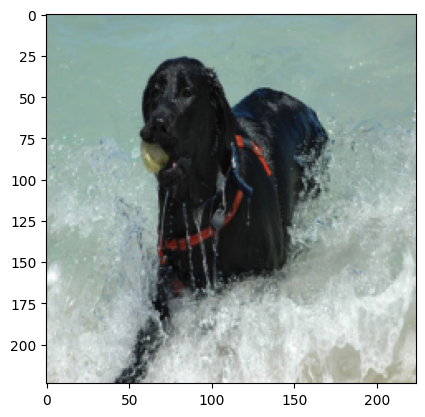

GT Sentence: the black dog waring a red collar is running through the water with a ball in its mouth . EOS 
Predicted Sentence: a black laborador with a ball in its mouth coming out of the water . EOS 
Input Image:


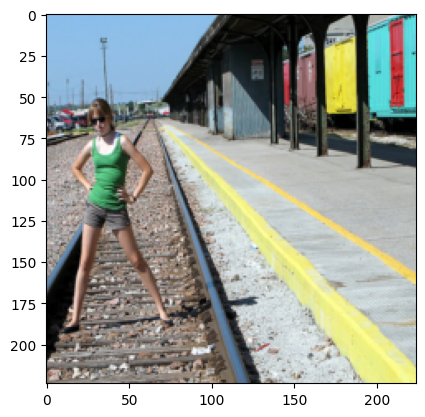

GT Sentence: a girl poses on the train tracks near a station EOS 
Predicted Sentence: a woman in a yellow tank top and shorts walks along railroad tracks . EOS 
Input Image:


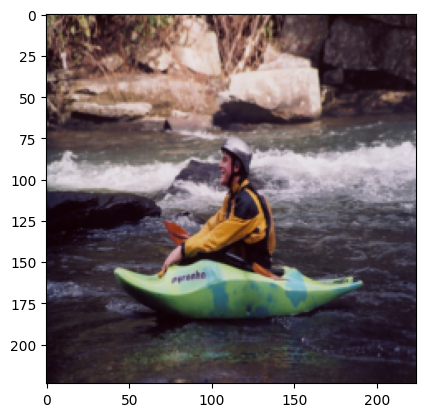

GT Sentence: a man smiles in his blue and green kayak . EOS 
Predicted Sentence: a man in a yellow kayak is paddling a kayak along a river . EOS 
Input Image:


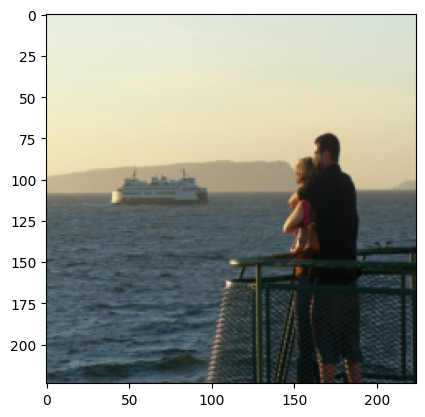

GT Sentence: "a couple hold each other , standing on a ferry , looking out at a ferry ." EOS 
Predicted Sentence: a couple stands on a dock and look out over the water . EOS 
Input Image:


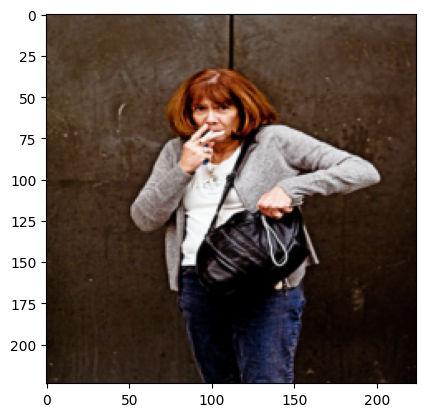

GT Sentence: a woman in gray is smoking a cigarette . EOS 
Predicted Sentence: a woman with a black bag is smoking a cigarette . EOS 
Input Image:


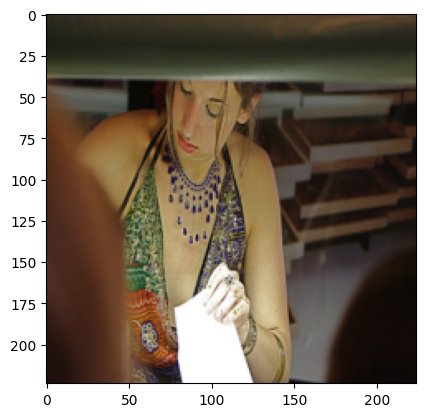

GT Sentence: the lady in the multi-colored shirt has a necklace on a white object in her hand . EOS 
Predicted Sentence: a woman in a striped shirt and gold sun looks at the camera . EOS 
Input Image:


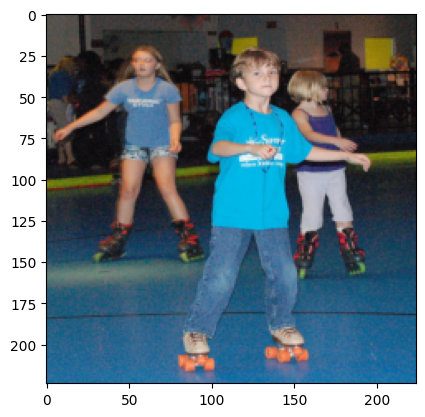

GT Sentence: "three children on skates in an arena two girls and one boy , boy is wearing orange wheeled skates ." EOS 
Predicted Sentence: two young girls learn ice skating . EOS 
Input Image:


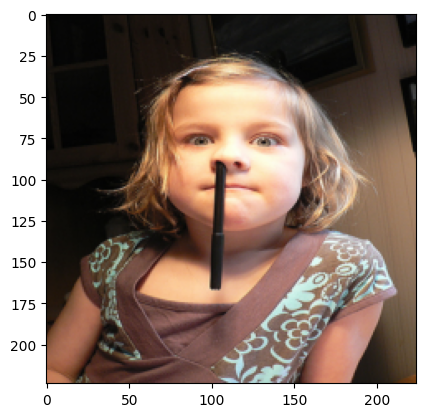

GT Sentence: the girl with the wide eyes has a marker hanging from her nose . EOS 
Predicted Sentence: a young girl is given a piece of sushi in her hair . EOS 
Input Image:


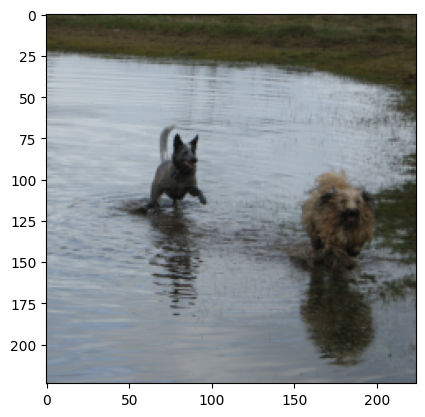

GT Sentence: two dogs playing on the shore . EOS 
Predicted Sentence: two dogs are playing in a lake . EOS 
Input Image:


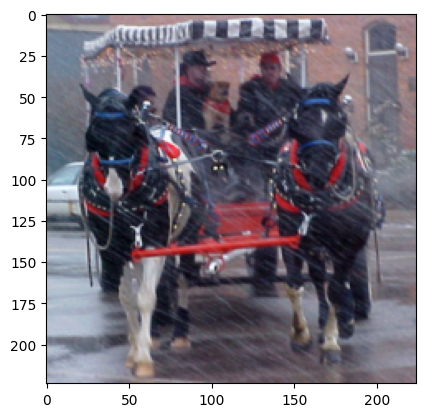

GT Sentence: "the horses pull the carriage , holding people and a dog , through the rain ." EOS 
Predicted Sentence: three horses carry the red and white horses . EOS 
Input Image:


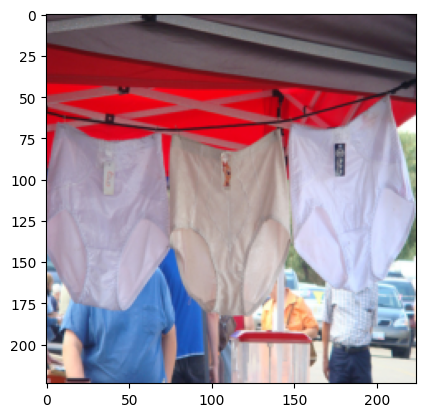

GT Sentence: three pairs of granny panties hanging on a line . EOS 
Predicted Sentence: three pairs of different-colored underwear hanging from clothesline in a tent shelter . EOS 
Input Image:


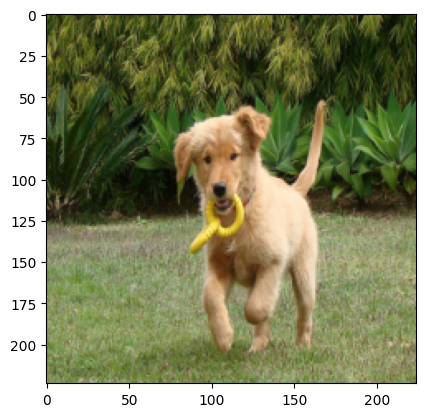

GT Sentence: a cute puppy fetches a yellow ring chew toy in the yard . EOS 
Predicted Sentence: a tan dog carries a yellow toy in its mouth . EOS 
Input Image:


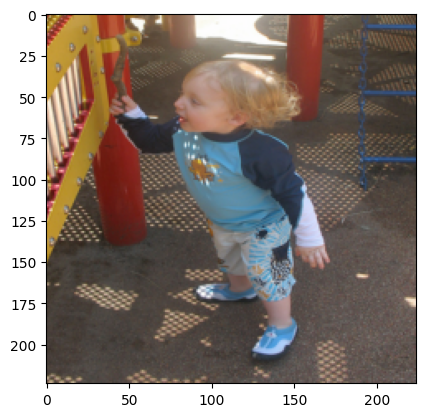

GT Sentence: a small child is wearing a blue outfit with blue shoes . EOS 
Predicted Sentence: a little girl plays on a playground . EOS 
Input Image:


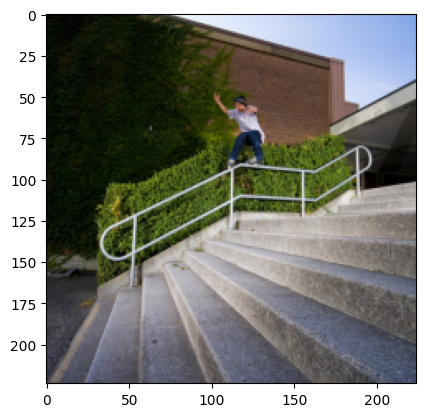

GT Sentence: a man is rollerblading down a white railing beside a red brick building . EOS 
Predicted Sentence: a man rollerblades on a ledge on a ramp . EOS 
Input Image:


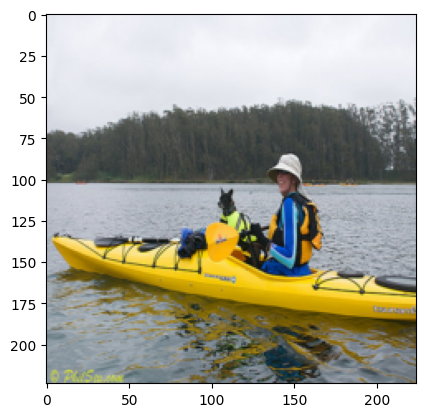

GT Sentence: the person and the dog are sitting on the yellow canoe . EOS 
Predicted Sentence: a woman and a dog are in a kayak on the water . EOS 
Input Image:


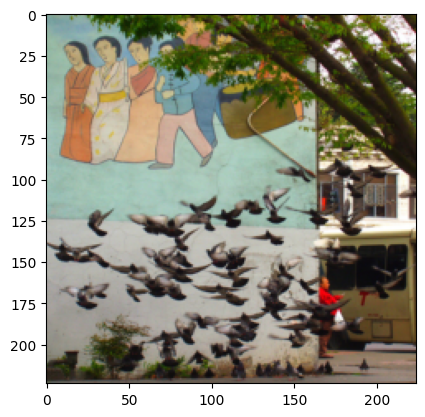

GT Sentence: flock of pigeons flying in front of building with a mural painted on it . EOS 
Predicted Sentence: a flock of birds disturbed and a man is fixing the ground and a few indescript birds are working . EOS 
Input Image:


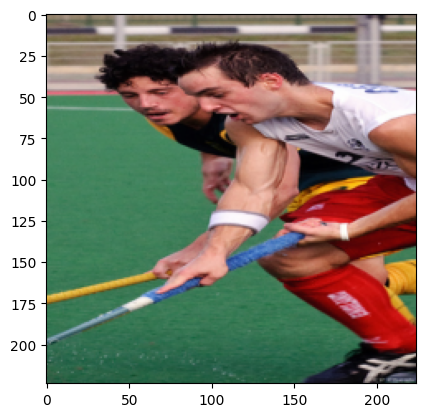

GT Sentence: two men are playing in a sports game together . EOS 
Predicted Sentence: two men playing a sport fighting . EOS 
Input Image:


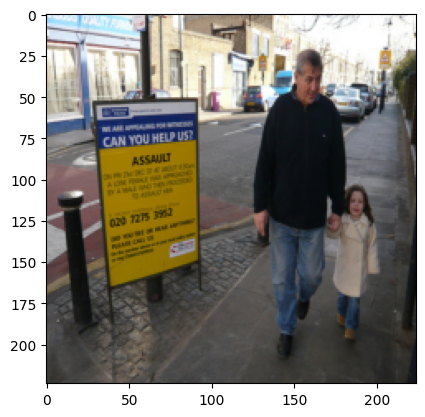

GT Sentence: a man and girl hold hands walking down the street . EOS 
Predicted Sentence: a man and a woman walking past an outdoor market . EOS 
Input Image:


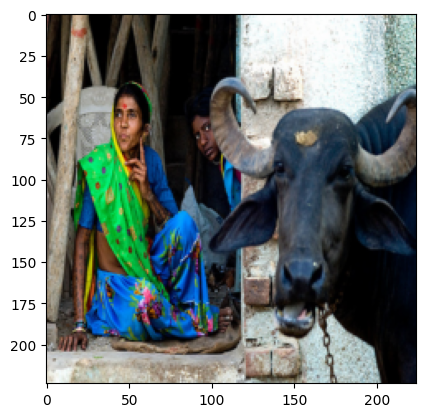

GT Sentence: "two women in india , sitting near an ox ." EOS 
Predicted Sentence: a man and a woman are standing outside a thatched store . EOS 
Input Image:


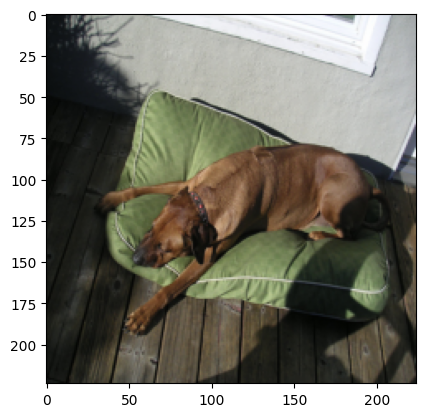

GT Sentence: a brown dog laying on a green cushion . EOS 
Predicted Sentence: a brown dog is laying on a green cushion on a green cushion . EOS 
Input Image:


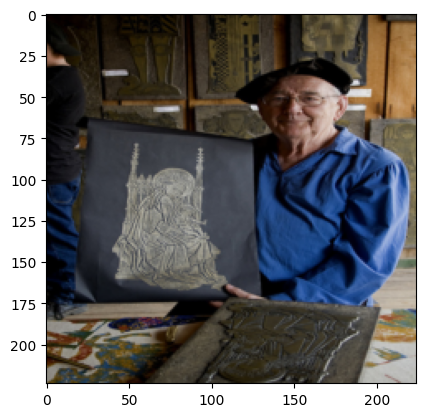

GT Sentence: the man in the blue shirt shows of a picture . EOS 
Predicted Sentence: a man in a blue shirt is holding a piece of canvas art . EOS 
Input Image:


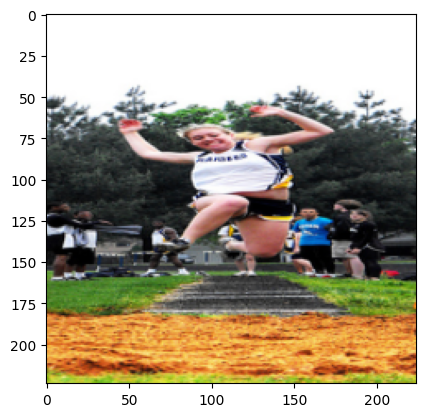

GT Sentence: a woman competing in a long jump competition . EOS 
Predicted Sentence: a woman in a white shirt and black pants is jumping in the air . EOS 
Input Image:


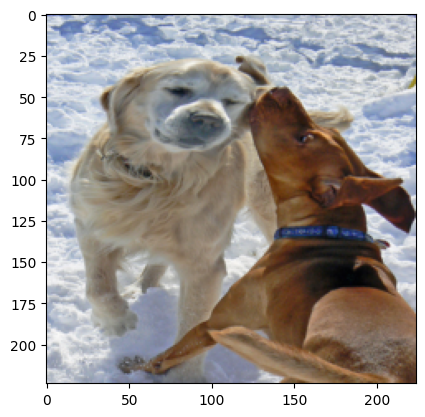

GT Sentence: a beige dog and brown dog in the snow . EOS 
Predicted Sentence: two dogs are playing in the snow . EOS 
Input Image:


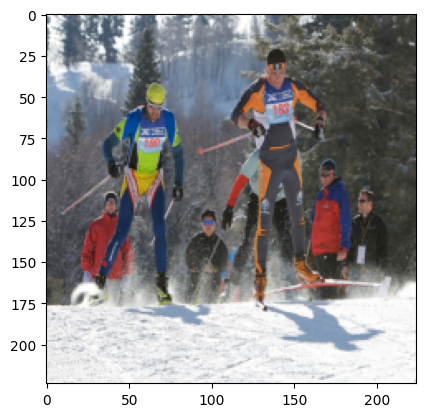

GT Sentence: skiiers race in the snow . EOS 
Predicted Sentence: skiers are skiing down a snowy hill . EOS 
Input Image:


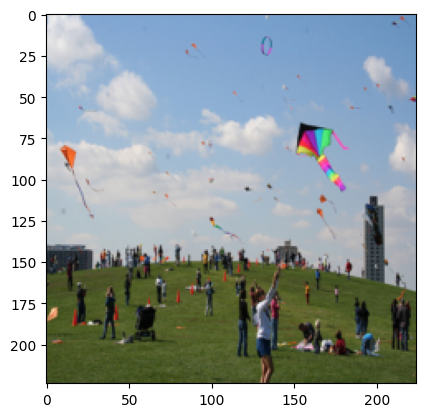

GT Sentence: a group of people are standing in a field flying kites . EOS 
Predicted Sentence: people fly kites in a park . EOS 
Input Image:


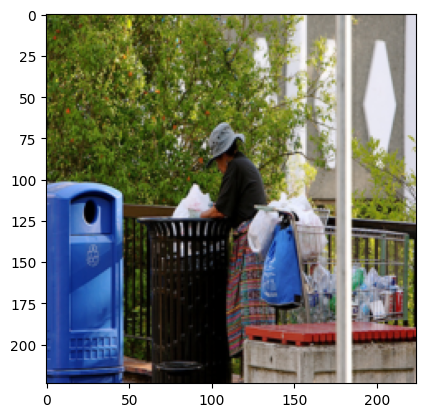

GT Sentence: a woman with a shopping cart is rummaging through a trashcan . EOS 
Predicted Sentence: a woman collects recyclable trash . EOS 
Input Image:


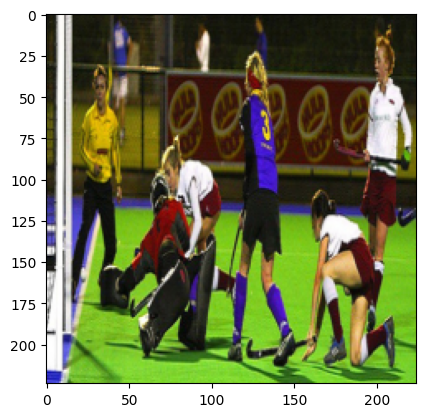

GT Sentence: a group of girls playing field hockey . EOS 
Predicted Sentence: five women in uniform are playing soccer . EOS 
-----------------------------------
Epoch=1 Loss=7.8013


In [33]:
for e in range(1):
    print("Epoch=",e+1, " Loss=", round(eval_one_epoch(),4), sep="")